In [1]:
library(dplyr)   
library(caret)
library(tidyverse)

load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_finale.Rdata")

options(repr.plot.width = 20, repr.plot.height =10, repr.plot.res = 500)

load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_iniziale.Rdata")
df <- DatiUsati1
rm(DatiUsati1)

Warning message:
"package 'dplyr' was built under R version 3.6.3"

Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union


Warning message:
"package 'caret' was built under R version 3.6.3"
Loading required package: lattice

Warning message:
"package 'lattice' was built under R version 3.6.2"
Loading required package: ggplot2

Warning message:
"package 'tidyverse' was built under R version 3.6.3"
-- Attaching packages ------------------------------------------------------------------------------- tidyverse 1.3.0 --

v tibble  3.1.0     v purrr   0.3.4
v tidyr   1.1.2     v stringr 1.4.0
v readr   1.4.0     v forcats 0.5.1

Warning message:
"package 'tibble' was built under R version 3.6.2"
Warning message:
"package 'tidyr' was built under R version 3.6.3"
Warning message:
"package 'readr' was built under R version 3.6.3"
Warning message:
"pack

In [2]:
df <- df[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps","leastOneEpathenal",
           "leastOneSpontaneousBacterial","thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","CristalloidiComp","ColloidiComp","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "scoreCHILD","organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

In [3]:
# colestatiche




df <-  df %>% 
  mutate(colestatiche = case_when(liverDisords_cirrhosisBiliaryPrimitiv==1|liverDisords_cirrhosisBiliarySecond==1|
                                  liverDisords_primitScleroColangitis==1|
          liverDisords_extraEpathiBileDucts==1|liverDisords_otherCongenitBilia==1|
                                  liverDisords_otherCholestaticDisease==1~ 1,
                                  TRUE~ 0))

df$colestatiche <- as.factor(df$colestatiche)

df <- subset(df, select= - c(liverDisords_cirrhosisBiliaryPrimitiv,liverDisords_cirrhosisBiliarySecond,
                             liverDisords_primitScleroColangitis,liverDisords_extraEpathiBileDucts,
                            liverDisords_otherCongenitBilia, liverDisords_otherCholestaticDisease))



#rare

df <-  df %>% 
  mutate(rare = case_when(liverDisords_Hemochromatosis == 1|liverDisords_cirrhosisCryptogenetic == 1|
    liverDisords_cirrhosisOtherRaison == 1|liverDisords_otherIndication == 1|liverDisords_wilsonDisease == 1|
    liverDisords_cirrhosisDrugs == 1| liverDisords_buddChiariSyndrome == 1 | 
                          liverDisords_polycysticDisease == 1 | liverDisords_cirrhosisAutoimmune == 1 ~ 1,
                          TRUE ~ 0))

df$rare <- as.factor(df$rare)

df <- subset(df, select= - c(liverDisords_Hemochromatosis,liverDisords_cirrhosisCryptogenetic,
                             liverDisords_cirrhosisOtherRaison,liverDisords_otherIndication,liverDisords_wilsonDisease,
                            liverDisords_buddChiariSyndrome,liverDisords_polycysticDisease,liverDisords_cirrhosisAutoimmune))


#virali

df <-  df %>% 
  mutate(virali = case_when(liverDisords_cirrhosisVirusC == 1|liverDisords_cirrhosisVirusB == 1|
                            liverDisords_cirrhosisVirusD == 1|
                            liverDisords_cirrhosisVirusOther == 1 ~ 1,
                            TRUE ~ 0))

df$virali <- as.factor(df$virali)

df <- subset(df, select= - c(liverDisords_cirrhosisVirusC,liverDisords_cirrhosisVirusB,
                             liverDisords_cirrhosisVirusD,liverDisords_cirrhosisVirusOther))



#tumore

df <-  df %>% 
  mutate(tumore = case_when(liverDisords_HCCstageI == 1 | liverDisords_HCCstageII == 1 ~ 1,                 
                            TRUE ~ 0))

df$tumore <- as.factor(df$tumore)

df <- subset(df, select= - c(liverDisords_HCCstageI,liverDisords_HCCstageII))

In [4]:
aggregate(sapply(df,class), by=list(sapply(df,class)), FUN=length)

Group.1,x
character,3
Date,1
factor,74
numeric,31


In [5]:
colnames(select_if(df, function(col) is.character(col)))

[1] "patientKey"             "icuAdmDate__icuAdmTime" "centreCode"

In [6]:
df$CentreCode <- as.factor(df$centreCode)

In [7]:
df1 <- df %>% filter(degenzaPostTraOSP <= 8)

df2 <- df %>% filter(degenzaPostTraOSP > 8)

In [9]:
paste("I pazienti con degenza minore o uguale a 8 giorni sono", nrow(df1))
paste("I pazienti con degenza superiore a 8 giorni", nrow(df2))

[1] "I pazienti con degenza minore o uguale a 8 giorni sono 157"

[1] "I pazienti con degenza superiore a 8 giorni 998"

In [12]:
# Data

print("<= 8")
summary(df1$icuAdmDate__icuAdmDate)

print("> 8")
summary(df2$icuAdmDate__icuAdmDate)

[1] "<= 8"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-10-23" "2020-01-22" "2020-12-22" "2020-09-21" "2021-06-04" "2021-12-15"

[1] "> 8"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-09-26" "2019-10-31" "2020-08-15" "2020-07-30" "2021-04-29" "2021-12-31"

In [14]:
# Orario (è una variabile "character" quindi posso confrontare solo in questo modo senza fare ulteriori modifche)

print("<= 8")
table(df1$icuAdmDate__icuAdmTime)

print("> 8")
table(df2$icuAdmDate__icuAdmTime)

[1] "<= 8"



00:05 00:10 00:15 00:34 01:00 01:25 01:45 01:53 02:00 02:15 02:30 02:45 03:00 
    1     1     1     1     1     1     1     1     2     1     1     1     1 
03:07 03:10 03:43 04:00 04:30 05:10 05:15 06:25 06:30 09:30 10:00 10:10 11:30 
    1     1     1     1     2     1     1     1     1     1     1     1     1 
11:58 12:00 12:05 12:15 12:21 12:32 12:42 12:58 13:02 13:10 13:27 13:52 13:55 
    1     1     1     1     1     1     1     1     2     1     1     2     1 
13:56 13:57 14:00 14:04 14:10 14:11 14:12 14:13 14:15 14:16 14:17 14:18 14:30 
    1     2     4     1     1     1     1     1     2     1     1     1     1 
14:35 14:36 14:39 14:40 14:54 14:56 14:57 15:00 15:05 15:08 15:10 15:13 15:17 
    1     1     1     2     2     1     1     4     1     1     1     2     1 
15:20 15:25 15:41 15:46 15:48 15:54 16:00 16:02 16:16 16:22 16:26 16:29 16:30 
    2     1     1     1     1     1     3     1     1     1     1     1     1 
16:38 16:44 16:51 16:52 16:59 17:00 17:05 17:30 17:

[1] "> 8"



00:00 00:10 00:15 00:20 00:28 00:30 00:35 00:40 00:45 00:50 00:56 01:00 01:15 
    1     1     2     3     1     5     1     1     2     2     1     8     1 
01:17 01:23 01:24 01:29 01:30 01:35 01:40 01:42 01:45 01:50 01:57 02:00 02:10 
    1     1     1     1     6     1     1     1     2     1     1     6     2 
02:15 02:28 02:30 02:40 02:49 03:00 03:18 03:30 03:36 03:45 03:50 03:53 03:56 
    1     1     1     1     1     4     1     4     1     1     3     1     1 
04:00 04:07 04:15 04:30 04:33 04:35 04:36 04:56 05:00 05:18 05:30 05:41 05:50 
    7     1     1     4     1     1     1     1     3     1     1     1     1 
05:53 06:00 06:13 06:30 06:45 06:59 07:00 07:10 07:15 07:25 07:27 07:30 07:33 
    1     4     1     2     2     1     3     2     1     1     1     2     1 
07:35 08:00 08:09 08:24 08:30 08:49 08:50 09:42 10:00 10:03 10:04 10:10 10:20 
    1     5     1     1     4     1     2     1     9     1     1     1     2 
10:30 10:51 11:00 11:10 11:19 11:24 11:30 11:35 11:

In [15]:
descrittiva_discrete <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {
            
            par(mfrow=c(1,2))
            print("<= 8")
            print(table(df1[[column]]))
            barplot(table(df1[[column]]), main="<= 8", col="blue", ylim = c(0, 500))

            print("<= 18")
            print(table(df2[[column]]))
            barplot(table(df2[[column]]), main="<= 18", col="blue", ylim = c(0, 500))
            
            
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
        }
        
}




descrittiva_continue <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {

            par(mfrow=c(1,2))

            print("<= 8")
            print(summary(df1[[column]]))
            hist(df1[[column]], main="<= 8", col="blue",ylim= c(0,500))

            print("<= 18")
            print(summary(df2[[column]]))
            hist(df2[[column]], main="<= 18", col="blue", ylim = c(0, 500))
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
        }
}

In [20]:
descrittiva_discrete <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {
            
            par(mfrow=c(1,2))
            barplot(table(df1[[column]])/nrow(df1), main="<= 8", col="blue", ylim = c(0, 1))

            barplot(table(df2[[column]])/nrow(df2), main="> 8", col="blue", ylim = c(0, 1))
            
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
        }
        
}




descrittiva_continue <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {


            print("<= 8")
            print(column)
            print(summary(df1[[column]]))

            print("> 18")
            print(column)
            print(summary(df2[[column]]))
            print(wilcox.test(df1[[column]], df2[[column]]))
            
            cat("\n\n\n\n")
            
        }
}

In [21]:
df_discrete1 <- select_if(df1, function(col) is.factor(col))
df_discrete2 <- select_if(df2, function(col) is.factor(col))
                          
                          
df_continue1 <- select_if(df1, function(col) is.numeric(col))
df_continue2 <- select_if(df2, function(col) is.numeric(col))

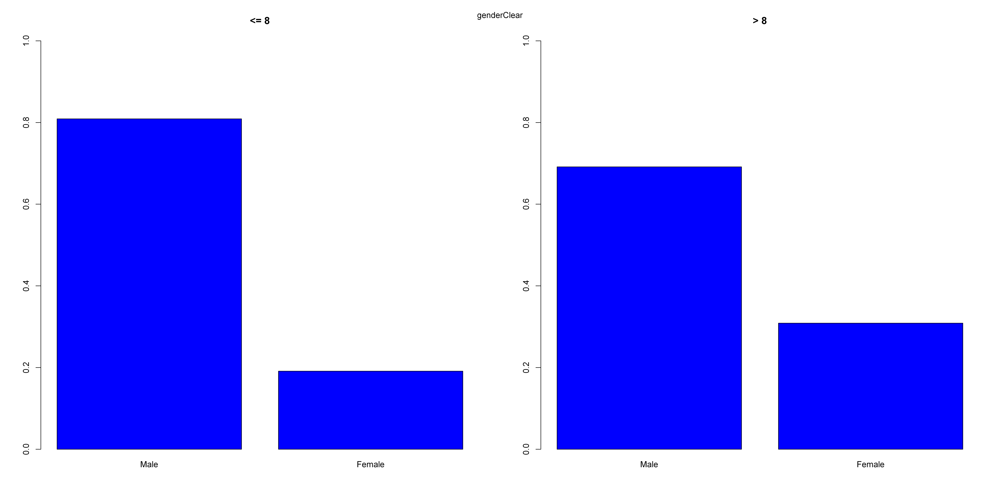

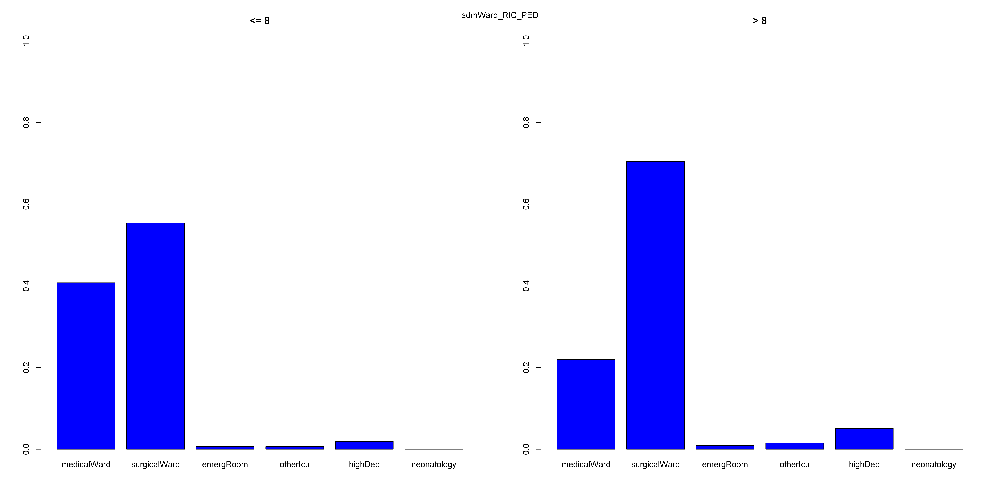

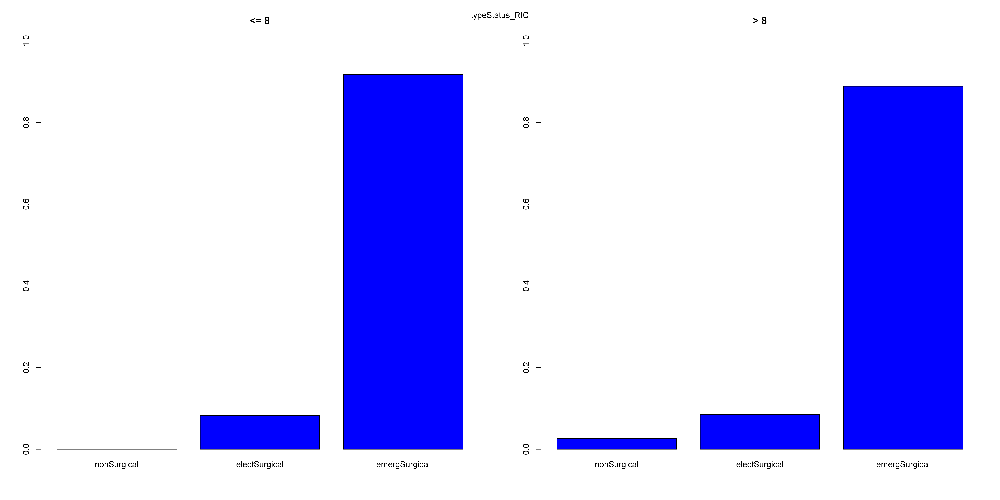

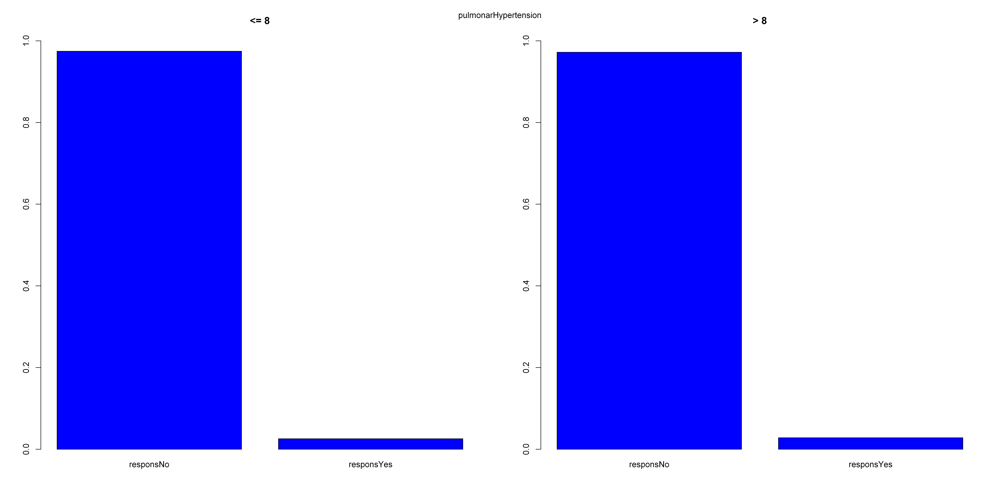

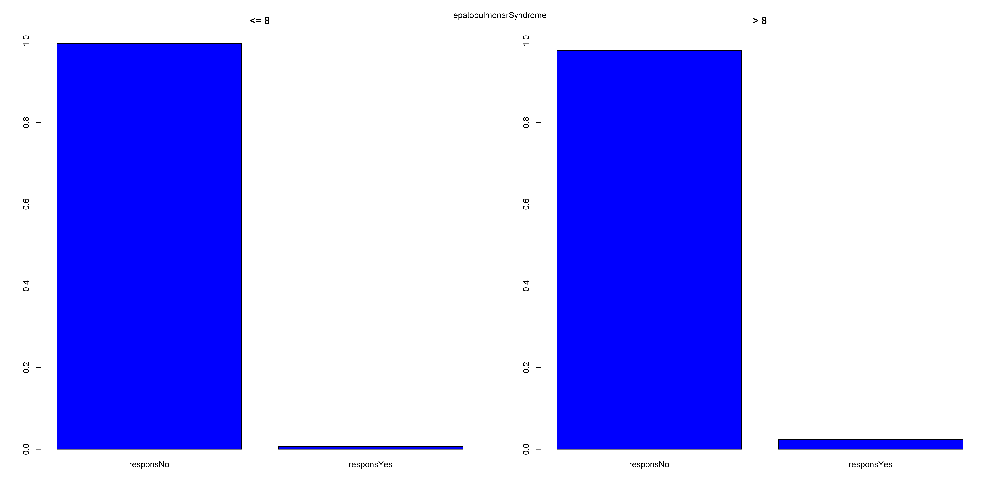

...

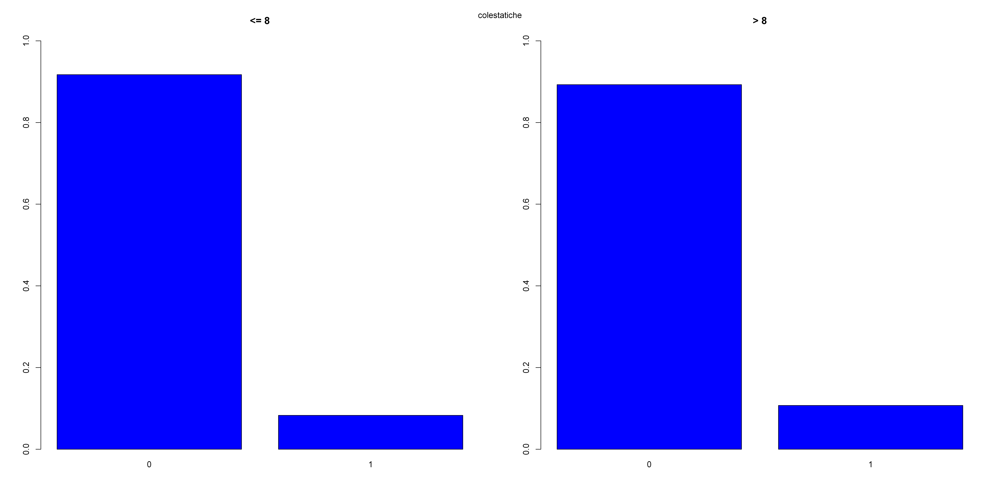

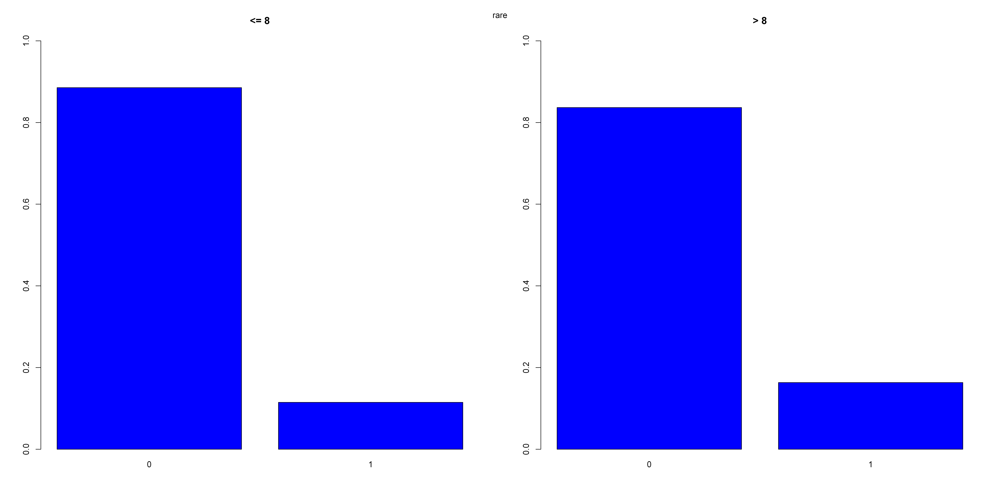

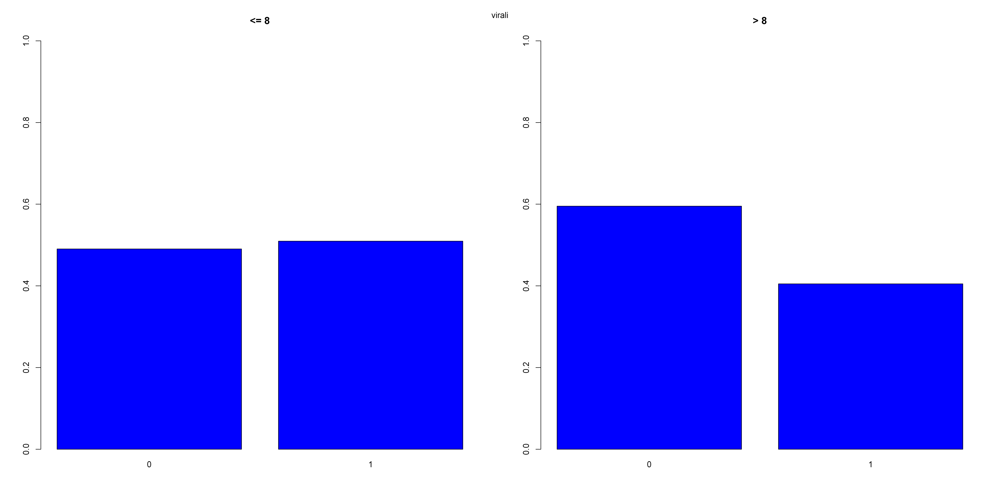

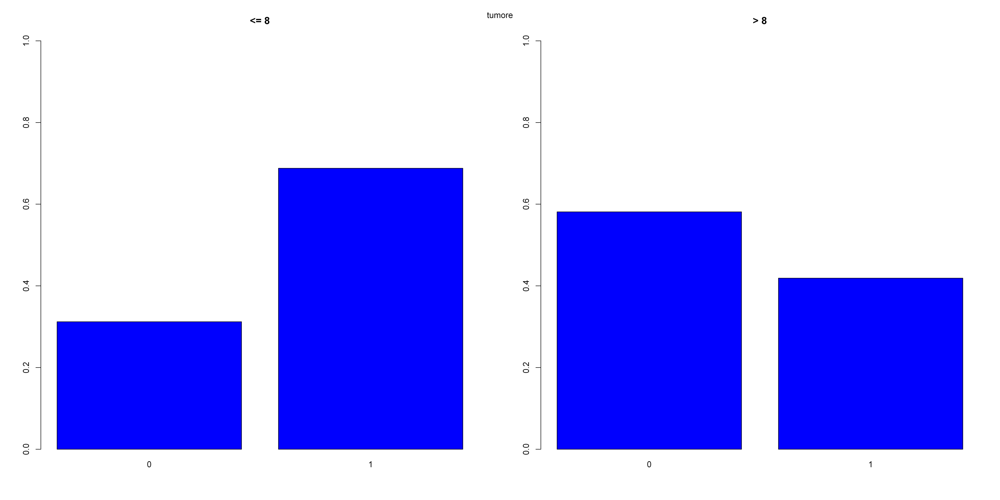

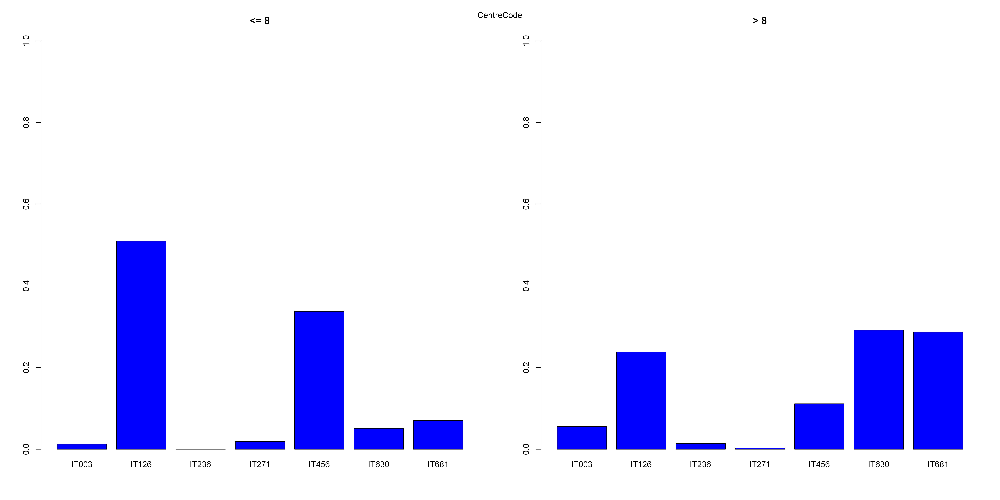

In [22]:
descrittiva_discrete(df_discrete1,df_discrete2)

In [19]:
descrittiva_continue(df_continue1, df_continue2)

[1] "<= 8"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   21.0    53.0    59.0    56.9    64.0    75.0 
[1] "> 18"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  14.00   52.00   58.00   56.15   63.00   75.00 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 82596, p-value = 0.2734
alternative hypothesis: true location shift is not equal to 0





[1] "<= 8"
[1] "degenzaPreTra"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.000   0.000   1.000   1.929   1.000  61.000       1 
[1] "> 18"
[1] "degenzaPreTra"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   6.504   2.000 304.000 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 64410, p-value = 0.000214
alternative hypothesis: true location shift is not equal to 0





[1] "<= 8"
[1] "bilirubinaTotale"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.300   0.710   1.100   2.6